In [1]:
import torch
import torch.nn as nn
#from models.common import *

# Architecture

In [2]:
""" Convolutional block:
    It follows a two 3x3 convolutional layer, each followed by a batch normalization and a relu activation.
"""
class conv_block(nn.Module):
    def __init__(self, in_c, out_c, k_size):
        super().__init__()

        to_pad = int((k_size-1)/2)

        self.conv1 = nn.Conv2d(in_c, out_c, kernel_size=k_size, padding=to_pad, padding_mode='reflect')
        self.bn1 = nn.BatchNorm2d(out_c)
        self.relu = nn.LeakyReLU(0.2, inplace=True)

    def forward(self, inputs):
      
        x = self.conv1(inputs)
        x = self.bn1(x)
        x = self.relu(x)

        return x

In [3]:
class encoder_block(nn.Module):
    def __init__(self, in_c, out_c, filter_size_down):
        super().__init__()

        self.conv1 = nn.Conv2d(in_c, out_c, kernel_size=filter_size_down, padding=1, stride=2, padding_mode='reflect')
        self.bn1 = nn.BatchNorm2d(out_c)
        self.relu = nn.LeakyReLU(0.2, inplace=True)

        self.conv2 = conv_block(out_c, out_c, filter_size_down)

    def forward(self, inputs):
      
        x = self.conv1(inputs)
        x = self.bn1(x)
        x = self.relu(x)

        x = self.conv2(x)

        return x

In [4]:
class decoder_block(nn.Module):
    def __init__(self, in_c, out_c, filter_size_up, up_sampling_mode='bilinear'):
        super().__init__()

        self.bn1 = nn.BatchNorm2d(in_c) # Possible erreur lien entre encoder decoder et skip

        self.conv1 = conv_block(in_c,out_c,filter_size_up)

        self.conv2 = conv_block(out_c, out_c, 1)

        self.up = nn.Upsample(scale_factor=2, mode=up_sampling_mode)

    def forward(self, inputs, skip):

        x = torch.cat([inputs, skip], axis=1)
        x = self.up(x)
        x = self.bn1(x)
        x = self.conv1(x)
        x = self.conv2(x)

        return x

In [5]:
class decoder_noskip_block(nn.Module):
    def __init__(self, in_c, out_c, filter_size_up, up_sampling_mode='bilinear'):
        super().__init__()

        self.bn1 = nn.BatchNorm2d(in_c) # Possible erreur lien entre encoder decoder et skip

        self.conv1 = conv_block(in_c,out_c,filter_size_up)

        self.conv2 = conv_block(out_c, out_c, 1)

        self.up = nn.Upsample(scale_factor=2, mode=up_sampling_mode)

    def forward(self, inputs):

        x = self.up(inputs)
        x = self.bn1(x)
        x = self.conv1(x)
        x = self.conv2(x)

        return x

In [6]:
class build_hourglass(nn.Module):
    
    def __init__(self,input_depth=32,output_depth=3,
                 num_channels_down=[16, 32, 64, 128, 128], num_channels_up=[16, 32, 64, 128, 128],
                 num_channels_skip=[4, 4, 4, 4, 4], filter_size_down=3, filter_size_up=3, filter_skip_size=1, num_scales=5, up_samp_mode='bilinear'):
        super().__init__()

        num_channels_down = [num_channels_down]*num_scales if isinstance(num_channels_down, int) else num_channels_down
        num_channels_up =   [num_channels_up]*num_scales if isinstance(num_channels_up, int) else num_channels_up
        num_channels_skip = [num_channels_skip]*num_scales if isinstance(num_channels_skip, int) else num_channels_skip

        self.num_channels_skip = num_channels_skip

        assert len(num_channels_down) == len(num_channels_up) == len(num_channels_skip)

        self.num_scales = num_scales 
        
        attributes = []
        for i in range(num_scales):

          """ Encoder et Skip"""
          if i == 0:
            attributes.append(('e'+str(i+1),encoder_block(input_depth, num_channels_down[0],filter_size_down).type(torch.cuda.FloatTensor)))
            if num_channels_skip[i] != 0: # Ne pas créer de bloc skip s'il n'en existe pas
              attributes.append(('s'+str(i+1),conv_block(num_channels_down[0], num_channels_skip[i], filter_skip_size).type(torch.cuda.FloatTensor)))
          else:
            attributes.append(('e'+str(i+1),encoder_block(num_channels_down[i-1], num_channels_down[i], filter_size_down).type(torch.cuda.FloatTensor)))
            if num_channels_skip[i] != 0:
              attributes.append(('s'+str(i+1),conv_block(num_channels_down[i], num_channels_skip[i], filter_skip_size).type(torch.cuda.FloatTensor)))

          """ Decoder """
          if i == (num_scales-1):
            "Fond du réseau"
            if num_channels_skip[i] != 0:
              attributes.append(('d'+str(i+1),decoder_block(num_channels_down[i]+num_channels_skip[i], num_channels_up[i], filter_size_up, up_sampling_mode=up_samp_mode).type(torch.cuda.FloatTensor)))
            else: # Pas de skip
              attributes.append(('d'+str(i+1),decoder_noskip_block(num_channels_down[i]+num_channels_skip[i], num_channels_up[i], filter_size_up, up_sampling_mode=up_samp_mode).type(torch.cuda.FloatTensor)))
          else:
            if num_channels_skip[i] != 0:
              attributes.append(('d'+str(i+1),decoder_block(num_channels_up[i+1]+num_channels_skip[i], num_channels_up[i], filter_size_up, up_sampling_mode=up_samp_mode).type(torch.cuda.FloatTensor)))
            else:
              attributes.append(('d'+str(i+1),decoder_noskip_block(num_channels_up[i+1]+num_channels_skip[i], num_channels_up[i], filter_size_up, up_sampling_mode=up_samp_mode).type(torch.cuda.FloatTensor)))


        for key, value in attributes:
          setattr(self, key, value)

        self.conv = nn.Conv2d(num_channels_up[0],output_depth,1,padding=0, padding_mode='reflect')
        self.act = nn.Sigmoid()


    def forward(self, inputs):

        encoder = []
        for i in range(self.num_scales):
          if i == 0:
            encoder.append(getattr(self, 'e'+str(i+1))(inputs))
          else:
            encoder.append(getattr(self, 'e'+str(i+1))(encoder[i-1]))

        skip = []
        for i in range(self.num_scales):
            if self.num_channels_skip[i] != 0:
              skip.append(getattr(self, 's'+str(i+1))(encoder[i]))
            else:
              skip.append(1)

        decoder = []
        for i in range(self.num_scales,0,-1):
          if i == self.num_scales:
            if self.num_channels_skip[i-1] != 0:
              decoder.append(getattr(self, 'd'+str(i))(encoder[-1],skip[-1]))
            else:
              decoder.append(getattr(self, 'd'+str(i))(encoder[-1]))
          else:
            if self.num_channels_skip[i-1] != 0:
              decoder.append(getattr(self, 'd'+str(i))(decoder[self.num_scales-i-1],skip[i-1]))
            else:
              decoder.append(getattr(self, 'd'+str(i))(decoder[self.num_scales-i-1]))
        
        c = self.conv(decoder[-1])
        output = self.act(c)

        return output

In [ ]:
in_depth = 32
inputs = torch.randn((2, in_depth, 512, 512)).type(torch.cuda.FloatTensor)
model = build_hourglass(input_depth=in_depth,output_depth=3,
                 num_channels_down=[16, 32, 64, 128, 128], num_channels_up=[16, 32, 64, 128, 128],
                 num_channels_skip=[0, 0, 0, 4, 4]).type(torch.cuda.FloatTensor)
y = model(inputs)
print(y.shape)

5
4
3
2


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3458: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)


1
torch.Size([2, 3, 512, 512])


# Test

In [7]:
!git clone https://github.com/DmitryUlyanov/deep-image-prior
!mv deep-image-prior/* ./

Cloning into 'deep-image-prior'...
remote: Enumerating objects: 289, done.
remote: Total 289 (delta 0), reused 0 (delta 0), pack-reused 289
Receiving objects: 100% (289/289), 24.28 MiB | 32.04 MiB/s, done.
Resolving deltas: 100% (155/155), done.


In [9]:
from __future__ import print_function
import matplotlib.pyplot as plt
%matplotlib inline

import os
#os.environ['CUDA_VISIBLE_DEVICES'] = '3'

import numpy as np
from models import *

import torch
import torch.optim

from skimage.measure import compare_psnr
from utils.denoising_utils import *

torch.backends.cudnn.enabled = True
torch.backends.cudnn.benchmark =True
dtype = torch.cuda.FloatTensor

imsize =-1
PLOT = True
sigma = 25
sigma_ = sigma/255.

In [10]:
# deJPEG 
# fname = 'data/denoising/snail.jpg'

## denoising
fname = 'data/denoising/F16_GT.png'

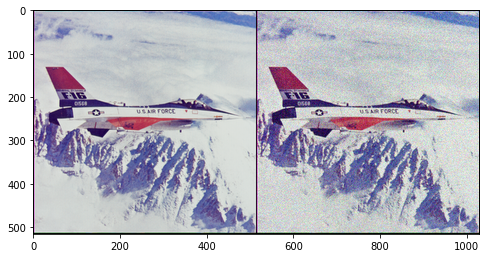

In [11]:
# Add synthetic noise
img_pil = crop_image(get_image(fname, imsize)[0], d=32)
img_np = pil_to_np(img_pil)

img_noisy_pil, img_noisy_np = get_noisy_image(img_np, sigma_)

if PLOT:
    plot_image_grid([img_np, img_noisy_np], 4, 6);

In [19]:
print(list_img_noisy_np[3].shape)

(3, 432, 640)


In [ ]:
INPUT = 'noise' # 'meshgrid'
pad = 'reflection'
OPT_OVER = 'net' # 'net,input'

reg_noise_std = 1./30. # set to 1./20. for sigma=50
LR = 0.01

OPTIMIZER='adam' # 'LBFGS'
show_every = 100
exp_weight=0.99

num_iter = 3000
input_depth = 32
figsize = 4 

net = build_hourglass(input_depth, 1, num_channels_down = 256, num_channels_up = 256, num_channels_skip = 8,num_scales=6,up_samp_mode='nearest').type(dtype)
    
net_input = get_noise(input_depth, INPUT, (img_pil.size[1], img_pil.size[0])).type(dtype).detach()

# Compute number of parameters
s  = sum([np.prod(list(p.size())) for p in net.parameters()]); 
print ('Number of params: %d' % s)

# Loss
mse = torch.nn.MSELoss().type(dtype)

img_noisy_torch = np_to_torch(img_noisy_np).type(dtype)

Number of params: 10638833


In [ ]:
net_input_saved = net_input.detach().clone()
noise = net_input.detach().clone()
out_avg = None
out = None
last_net = None
psrn_noisy_last = 0

i = 0
def closure():
    
    global i, out, out_avg, psrn_noisy_last, last_net, net_input
    
    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)
    
    out = net(net_input)
    
    # Smoothing
    if out_avg is None:
        out_avg = out.detach()
    else:
        out_avg = out_avg * exp_weight + out.detach() * (1 - exp_weight)
            
    total_loss = mse(out, img_noisy_torch)
    total_loss.backward()
        
    
    psrn_noisy = compare_psnr(img_noisy_np, out.detach().cpu().numpy()[0]) 
    psrn_gt    = compare_psnr(img_np, out.detach().cpu().numpy()[0]) 
    psrn_gt_sm = compare_psnr(img_np, out_avg.detach().cpu().numpy()[0]) 
    
    # Note that we do not have GT for the "snail" example
    # So 'PSRN_gt', 'PSNR_gt_sm' make no sense
    print ('Iteration %05d    Loss %f   PSNR_noisy: %f   PSRN_gt: %f PSNR_gt_sm: %f' % (i, total_loss.item(), psrn_noisy, psrn_gt, psrn_gt_sm), '\r', end='')
    if  PLOT and i % show_every == 0:
        out_np = torch_to_np(out)
        plot_image_grid([np.clip(out_np, 0, 1), 
                         np.clip(torch_to_np(out_avg), 0, 1)], factor=figsize, nrow=1)
        
        
    
    # Backtracking
    if i % show_every:
        if psrn_noisy - psrn_noisy_last < -5: 
            print('Falling back to previous checkpoint.')

            for new_param, net_param in zip(last_net, net.parameters()):
                net_param.data.copy_(new_param.cuda())

            return total_loss*0
        else:
            last_net = [x.detach().cpu() for x in net.parameters()]
            psrn_noisy_last = psrn_noisy
            
    i += 1

    return total_loss

p = get_params(OPT_OVER, net, net_input)
optimize(OPTIMIZER, p, closure, LR, num_iter)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
psrn_gt    = compare_psnr(img_np, out.detach().cpu().numpy()[0]) 
psrn_gt_sm = compare_psnr(img_np, out_avg.detach().cpu().numpy()[0])
print(psrn_gt)
print(psrn_gt_sm)

24.63982119124077
27.470880439818643


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
  


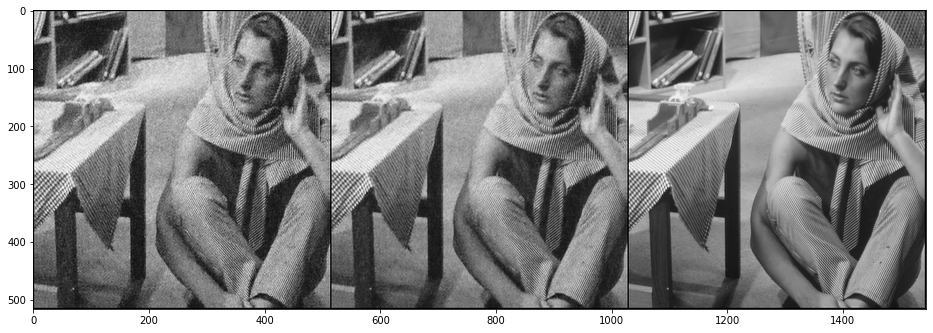

In [ ]:
out_np = torch_to_np(net(net_input))
q = plot_image_grid([np.clip(out_np, 0, 1), np.clip(torch_to_np(out_avg), 0, 1), img_np], factor=13);

# Test patches denoising

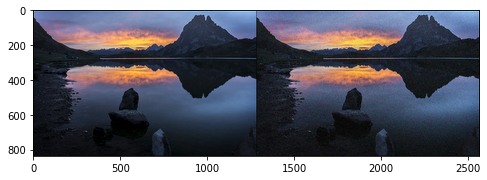

In [20]:
fname = "data_perso/photographe-paysage.jpg"

# Add synthetic noise
img_pil = crop_image(get_image(fname, imsize)[0], d=64)
img_np = pil_to_np(img_pil)

img_noisy_pil, img_noisy_np = get_noisy_image(img_np, sigma_)

if PLOT:
    plot_image_grid([img_np, img_noisy_np], 4, 6);

In [21]:
xmid = img_noisy_np.shape[1]//2
ymid = img_noisy_np.shape[2]//2

list_img_noisy_np = []
list_img_np = []
for i in range(2):
  for j in range(2):
    list_img_noisy_np.append(img_noisy_np[:,i*xmid:(i+1)*xmid,j*ymid:(j+1)*ymid])
    list_img_np.append(img_np[:,i*xmid:(i+1)*xmid,j*ymid:(j+1)*ymid])

In [22]:
INPUT = 'noise' # 'meshgrid'
pad = 'reflection'
OPT_OVER = 'net' # 'net,input'

reg_noise_std = 1./30. # set to 1./20. for sigma=50
LR = 0.01

OPTIMIZER='adam' # 'LBFGS'
show_every = 100
exp_weight=0.99

num_iter = 1800
input_depth = 32
figsize = 4 

#net = build_hourglass(input_depth, 1, num_channels_down = 256, num_channels_up = 256, num_channels_skip = 8,num_scales=6,up_samp_mode='nearest').type(dtype)
    
#net_input = get_noise(input_depth, INPUT, (ymid, xmid)).type(dtype).detach()

# Compute number of parameters
#s  = sum([np.prod(list(p.size())) for p in net.parameters()]); 
#print ('Number of params: %d' % s)

# Loss
mse = torch.nn.MSELoss().type(dtype)

list_img_torch = []
for i in range(len(list_img_noisy_np)):
  list_img_torch.append(np_to_torch(list_img_noisy_np[i]).type(dtype))

Starting optimization with ADAM


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:41: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:42: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:43: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.


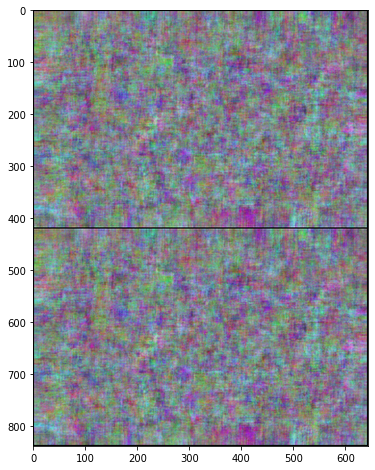

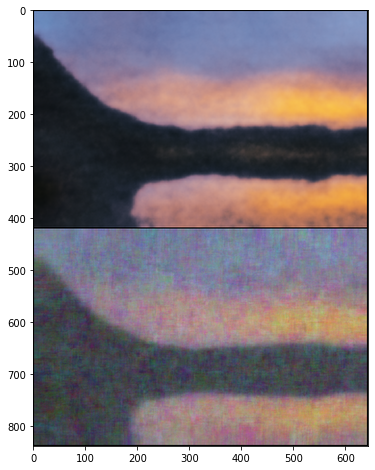

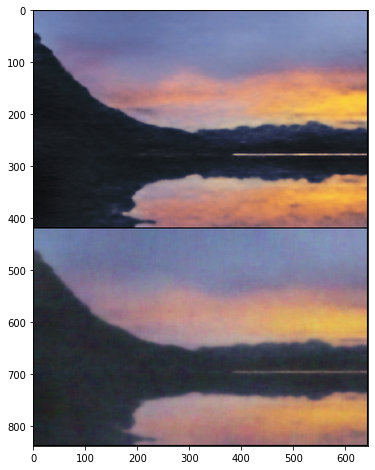

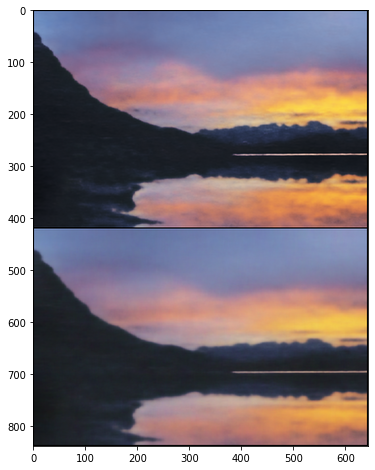

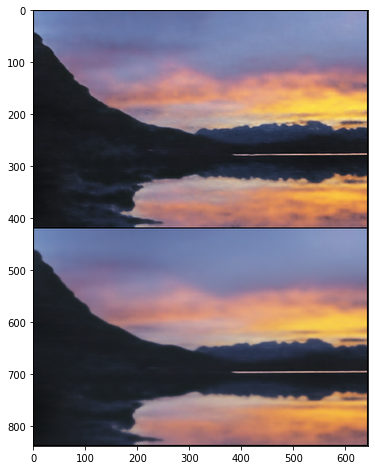

...

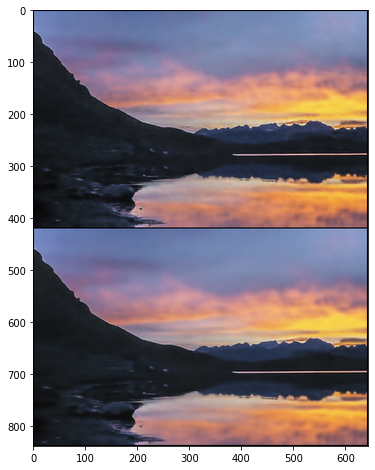

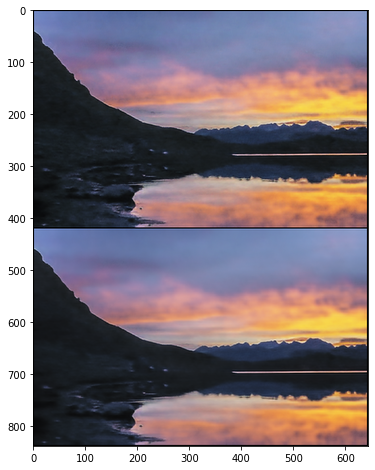

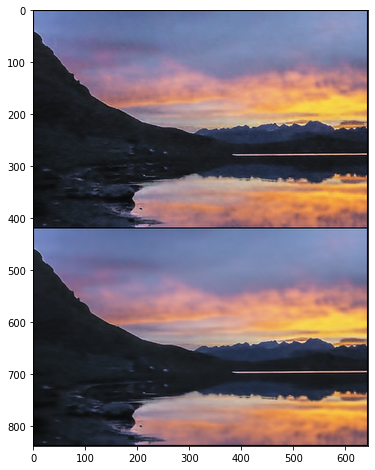

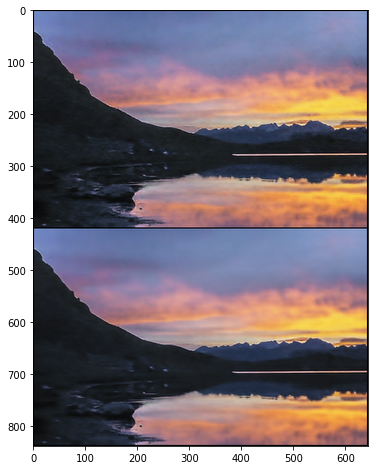

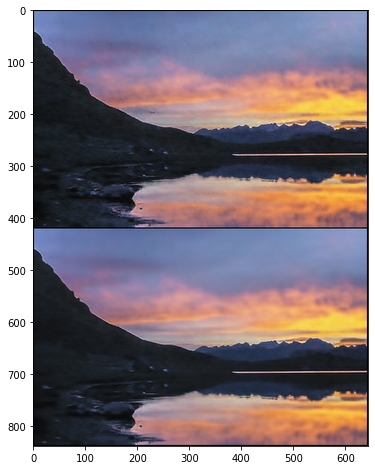

Starting optimization with ADAM


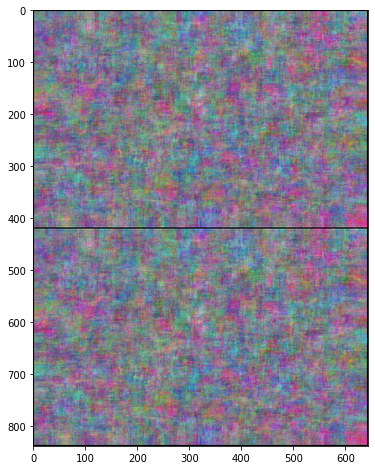

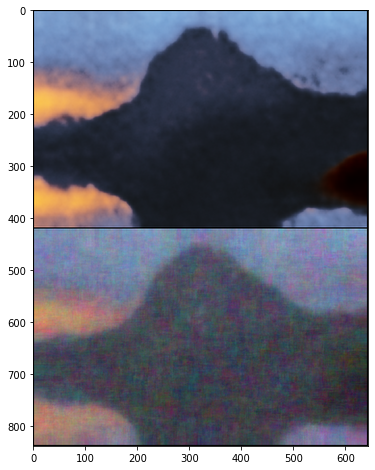

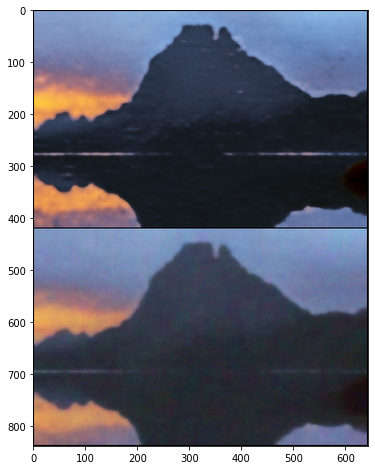

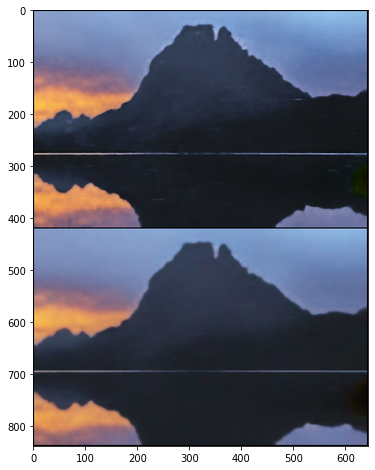

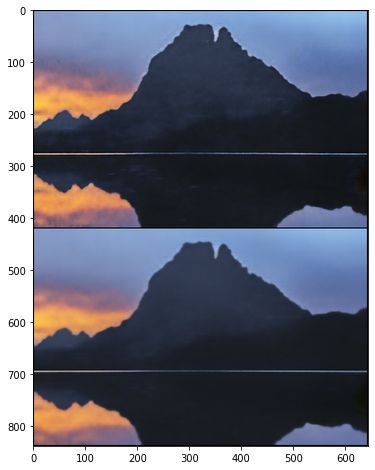

...

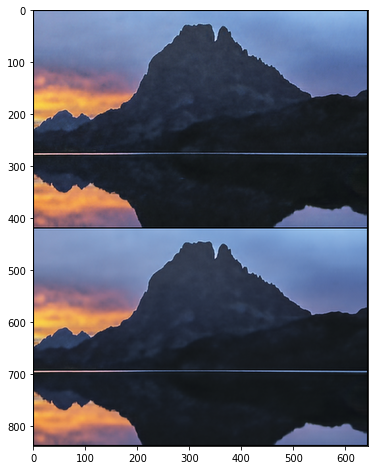

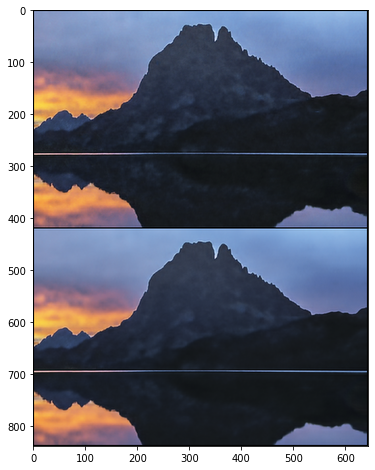

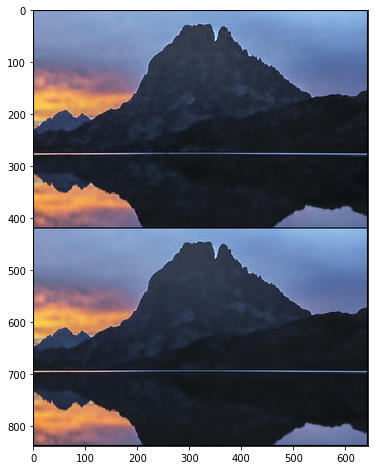

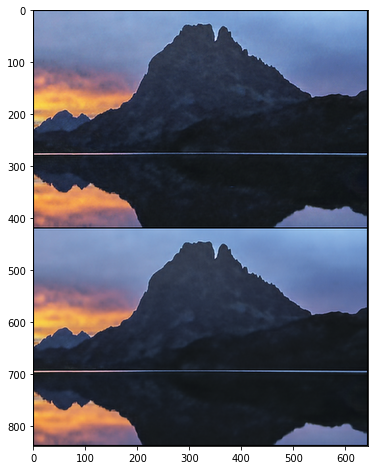

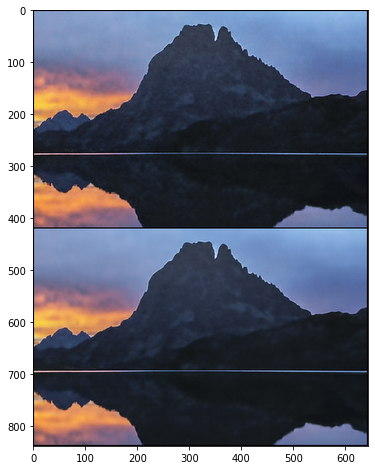

Starting optimization with ADAM


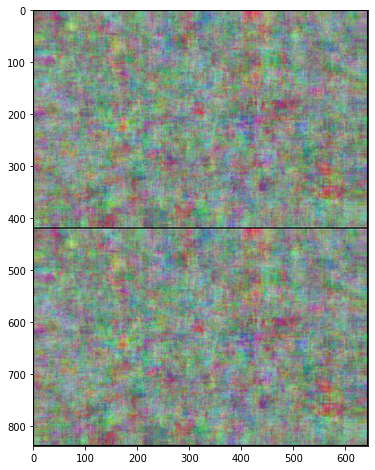

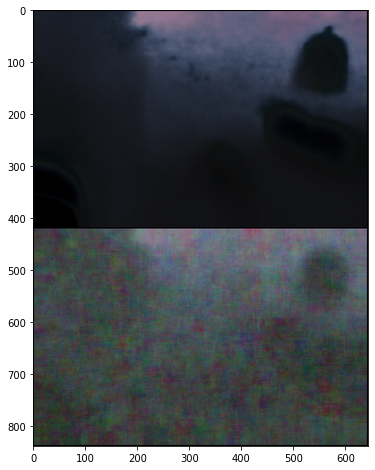

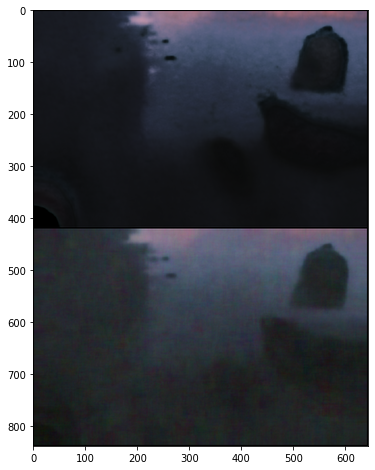

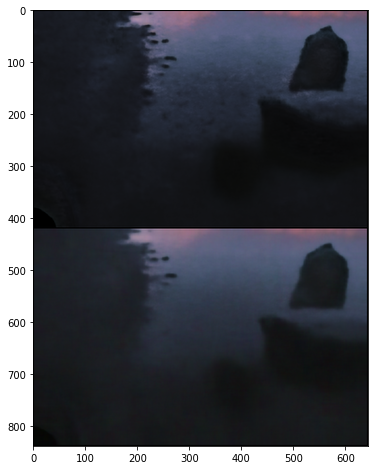

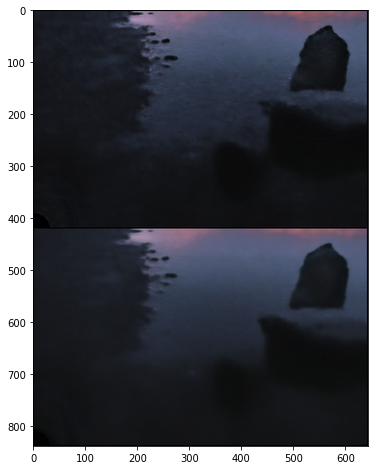

...

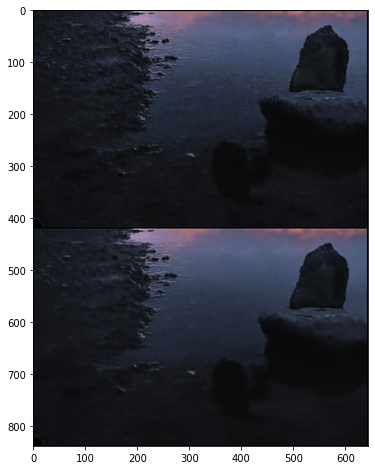

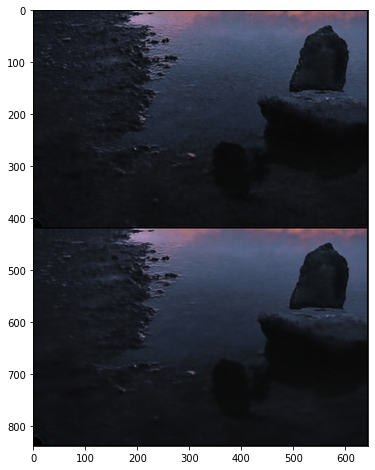

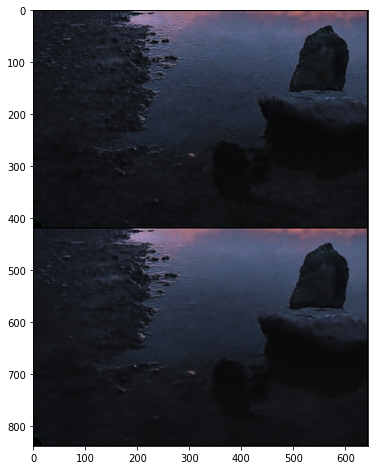

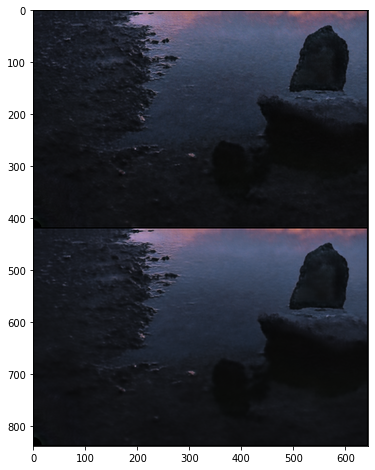

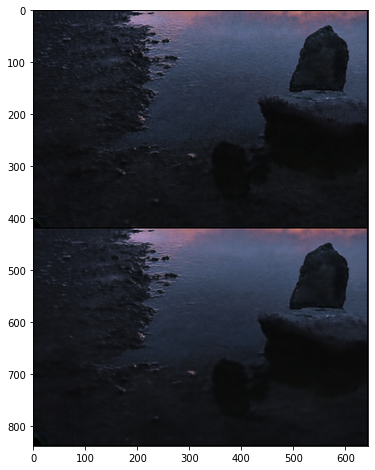

Starting optimization with ADAM


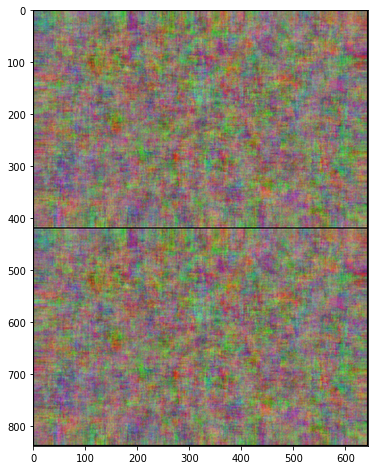

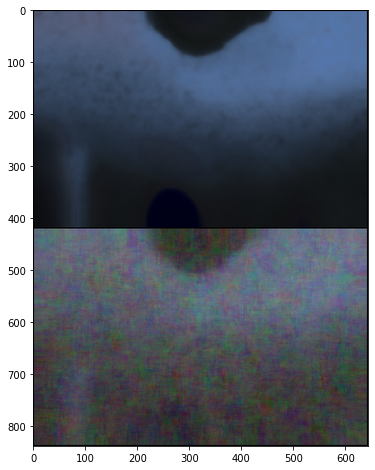

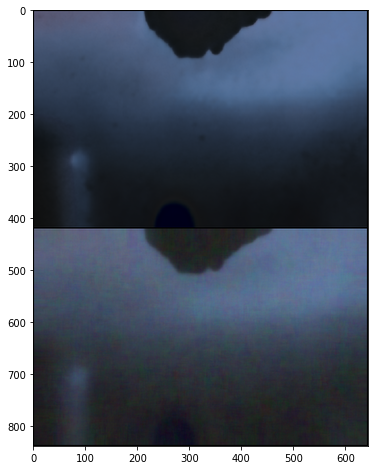

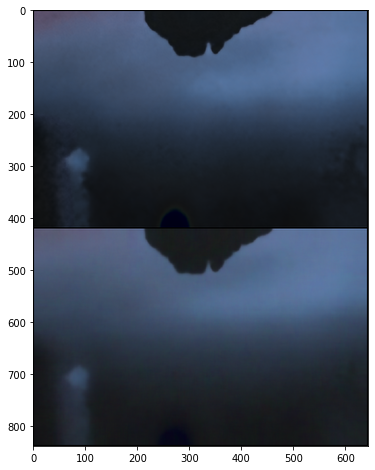

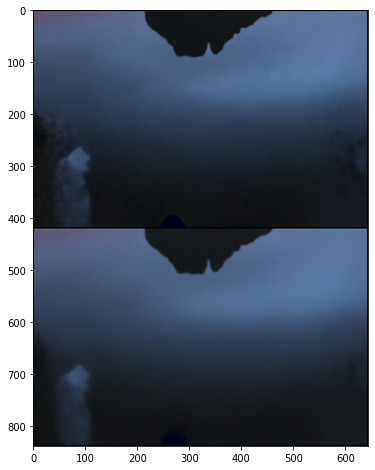

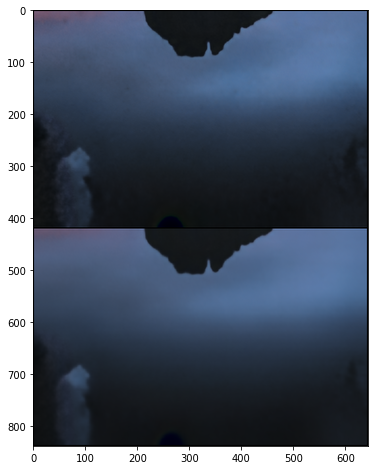

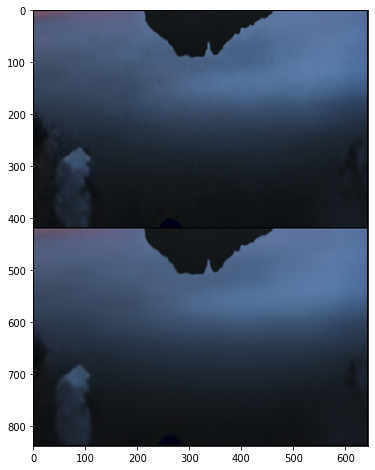

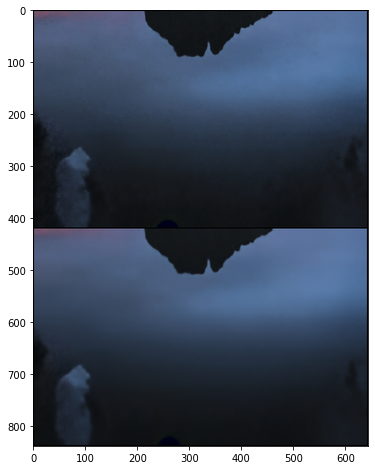

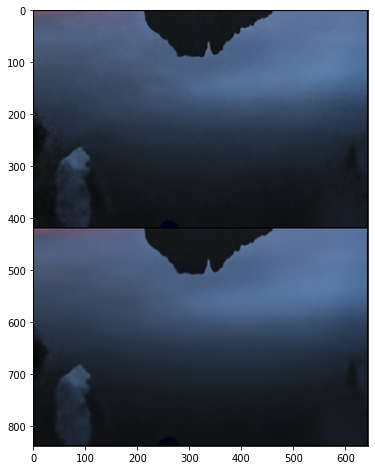

In [ ]:
list_out = []
list_out_avg = []

for i in range(len(list_img_torch)):

  img_noisy_torch = list_img_torch[i]
  img_noisy_np = list_img_noisy_np[i]
  img_np = list_img_np[i]

  net = build_hourglass(input_depth, 3, num_channels_down = 128, num_channels_up = 128, num_channels_skip = 4,num_scales=5,up_samp_mode='nearest').type(dtype)

  net_input = get_noise(input_depth, INPUT, (xmid, ymid)).type(dtype).detach()

  net_input_saved = net_input.detach().clone()
  noise = net_input.detach().clone()
  out_avg = None
  out = None
  last_net = None
  psrn_noisy_last = 0

  i = 0
  def closure():
      
      global i, out, out_avg, psrn_noisy_last, last_net, net_input
      
      if reg_noise_std > 0:
          net_input = net_input_saved + (noise.normal_() * reg_noise_std)
      
      out = net(net_input)
      
      # Smoothing
      if out_avg is None:
          out_avg = out.detach()
      else:
          out_avg = out_avg * exp_weight + out.detach() * (1 - exp_weight)
              
      total_loss = mse(out, img_noisy_torch)
      total_loss.backward()
          
      
      psrn_noisy = compare_psnr(img_noisy_np, out.detach().cpu().numpy()[0]) 
      psrn_gt    = compare_psnr(img_np, out.detach().cpu().numpy()[0]) 
      psrn_gt_sm = compare_psnr(img_np, out_avg.detach().cpu().numpy()[0]) 
      
      # Note that we do not have GT for the "snail" example
      # So 'PSRN_gt', 'PSNR_gt_sm' make no sense
      print ('Iteration %05d    Loss %f   PSNR_noisy: %f   PSRN_gt: %f PSNR_gt_sm: %f' % (i, total_loss.item(), psrn_noisy, psrn_gt, psrn_gt_sm), '\r', end='')
      if  PLOT and i % show_every == 0:
          out_np = torch_to_np(out)
          plot_image_grid([np.clip(out_np, 0, 1), 
                          np.clip(torch_to_np(out_avg), 0, 1)], factor=figsize, nrow=1)
          
          
      
      # Backtracking
      if i % show_every:
          if psrn_noisy - psrn_noisy_last < -5: 
              print('Falling back to previous checkpoint.')

              for new_param, net_param in zip(last_net, net.parameters()):
                  net_param.data.copy_(new_param.cuda())

              return total_loss*0
          else:
              last_net = [x.detach().cpu() for x in net.parameters()]
              psrn_noisy_last = psrn_noisy
              
      i += 1

      return total_loss

  p = get_params(OPT_OVER, net, net_input)
  optimize(OPTIMIZER, p, closure, LR, num_iter)

  list_out.append(out)
  list_out_avg.append(out_avg)

In [ ]:
list_psrn = []
for i in range(len(list_out)):
  psrn_noisy = compare_psnr(list_img_noisy_np, out.detach().cpu().numpy()[0]) 
  psrn_gt    = compare_psnr(img_np, out.detach().cpu().numpy()[0]) 
  psrn_gt_sm = compare_psnr(img_np, out_avg.detach().cpu().numpy()[0]) 